**Install pydrive for data loading**

In [ ]:
 #Install pydrive to load data
 !pip install -U -q PyDrive

 from pydrive.auth import GoogleAuth
 from pydrive.drive import GoogleDrive
 from google.colab import auth
 from oauth2client.client import GoogleCredentials

 auth.authenticate_user()
 gauth = GoogleAuth()
 gauth.credentials = GoogleCredentials.get_application_default()
 drive = GoogleDrive(gauth)

In [ ]:
# copy link and read dataset

link = 'https://drive.google.com/open?id=1J-d61aHgifLIyg2ExPXorC67XBG4P03g'
fluff, id = link.split('=')
file = drive.CreateFile({'id':id}) # replace the id with id of file you want to access
file.GetContentFile('churn.all')  


**Load Dataset**

In [ ]:
import io
import pandas as pd
import numpy as np
import imblearn

pd.set_option('display.max_columns', None)
df_churn = pd.read_csv('churn.all')
df_churn.head()

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


,state,account_length,area_code,phone_number,intl_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churned
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.


Step 1：Data Exploration
1. Dataset Overview (size, datatype, missing values)
2. Features Exploration (correlations)

In [ ]:
df_churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          5000 non-null   object 
 1   account_length                 5000 non-null   int64  
 2   area_code                      5000 non-null   int64  
 3   phone_number                   5000 non-null   object 
 4   intl_plan                      5000 non-null   object 
 5   voice_mail_plan                5000 non-null   object 
 6   number_vmail_messages          5000 non-null   int64  
 7   total_day_minutes              5000 non-null   float64
 8   total_day_calls                5000 non-null   int64  
 9   total_day_charge               5000 non-null   float64
 10  total_eve_minutes              5000 non-null   float64
 11  total_eve_calls                5000 non-null   int64  
 12  total_eve_charge               5000 non-null   f

Step 2: Feature Preprocessing
1. Observations (missing values, space removal, datatype transfer, corrolations, etc.)
2. categorical features processing (if any/encoding)

In [ ]:
df_churn.isnull().sum()

state                            0
account_length                   0
area_code                        0
phone_number                     0
intl_plan                        0
voice_mail_plan                  0
number_vmail_messages            0
total_day_minutes                0
total_day_calls                  0
total_day_charge                 0
total_eve_minutes                0
total_eve_calls                  0
total_eve_charge                 0
total_night_minutes              0
total_night_calls                0
total_night_charge               0
total_intl_minutes               0
total_intl_calls                 0
total_intl_charge                0
number_customer_service_calls    0
churned                          0
dtype: int64

In [ ]:
#!pip install pandas-profiling[notebook,html]
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

     - 48.0MB 637kB/s
     |████████████████████████████████| 71kB 2.0MB/s 
     |████████████████████████████████| 61kB 3.1MB/s 
     |████████████████████████████████| 604kB 4.4MB/s 
     |████████████████████████████████| 3.1MB 7.1MB/s 
     |████████████████████████████████| 71kB 6.9MB/s 
     |████████████████████████████████| 296kB 28.4MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-2.9.0rc1-py2.py3-none-any.whl size=258106 sha256=eed9d4a3d3cb3c536d4f6c8c7ff14c3adad0fc7c453feafe5bac7a8926c60f21
  Stored in directory: /tmp/pip-ephem-wheel-cache-67ioqwia/wheels/56/c2/dd/8d945b0443c35df7d5f62fa9e9ae105a2d8b286302b92e0109
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp36-none-any.whl size=27084 sha256=533a2e87bd8ae737a5fa32d54518237ebd64d177539db56e79a9d9320b18e037
  Stored in directory: /root/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f94066cf1db075540b85716c30255459
  Created wheel for imagehash: filename=ImageHash-4.1.0-py2.py3-none-any.whl size=291

In [ ]:
import pandas_profiling
pandas_profiling.ProfileReport(df_churn)

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


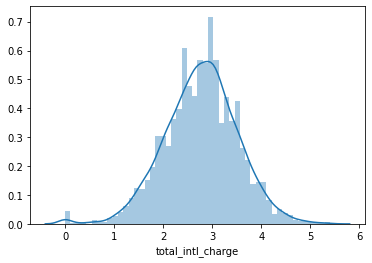

In [ ]:
# check feature distribution (If Needed)
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

sns.distplot(df_churn['total_intl_charge'])

According to the previous step,  we know that 4 pairs of highly correlated features:

total_day_charge ~ total_day_minutes

total_eve_charge ~ total_eve_minutes 

total_night_charge ~ total_night_minutes 

total_intl_charge ~ total_intl_minutes 

In [ ]:
# Drop 'Useless' Features
# Since [area_code(will be roughly represented by State)],[phone_number] are not essential for model training
# [churned] will be the label
to_drop = ['area_code', 'phone_number', 'churned']
churn_tidy = df_churn.drop(to_drop, axis=1)
churn_tidy.head()

,state,account_length,intl_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
0,KS,128,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1
1,OH,107,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1
2,NJ,137,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0
3,OH,84,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2
4,OK,75,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3


In [ ]:
churn_tidy['voice_mail_plan'][0]

' yes'

In [ ]:
churn_tidy['intl_plan'][0]

' no'

In [ ]:
df_churn['churned'][0]

' False.'

In [ ]:
# remove whitespaces in column data

churn_tidy['voice_mail_plan'] = churn_tidy['voice_mail_plan'].map(lambda x: x.strip())
print ('Trimmed [voice_mail_plan]:')
churn_tidy['voice_mail_plan'][0]

Trimmed [voice_mail_plan]:


'yes'

In [ ]:
# remove whitespaces in column data

churn_tidy['intl_plan'] = churn_tidy['intl_plan'].map(lambda x: x.strip())
print ('Trimmed [intl_plan]:')
churn_tidy['intl_plan'][0]

Trimmed [intl_plan]:


'no'

In [ ]:
df_churn['churned'] = df_churn['churned'].map(lambda x: x.strip())
churn_label = np.where(df_churn['churned'] == 'True.', 1, 0)
print ('Trimmed [churned]:')
df_churn['churned'][0]
#churn_label.sum()

Trimmed [churned]:


'False.'

In [ ]:
# Convert label "churned" to 1; "unchurned" to 0

churn_label = np.where(df_churn['churned'] == 'True.', 1, 0)
#print (str(churn_label))
#np.set_printoptions(threshold=10)
check_label_class = np.unique(churn_label)
print ('label class: '+ str(check_label_class))

label class: [0 1]


In [ ]:
# Convert "intl_plan", "voice_mail_plan" into Boolean values.

yes_no_cols = ["intl_plan", "voice_mail_plan"]
churn_tidy[yes_no_cols] = churn_tidy[yes_no_cols] == 'yes'
churn_tidy[yes_no_cols].head()

,intl_plan,voice_mail_plan
0,False,True
1,False,True
2,False,False
3,True,False
4,True,False


In [ ]:
# Categorical feature processing
# one-hot encoding for feature: "State"

#from category_encoders import *
all_state = churn_tidy['state']
ohe_state = pd.get_dummies(all_state)
ohe_state

In [ ]:
# Replace the original feature "state" with "ohe_state"
# Generate new dataset

churn_final = churn_tidy.drop('state', axis = 1)
churn_data = pd.concat([ohe_state, churn_final], axis = 1)
churn_data.info()

Step 3: Model Training
1. split dataset
2. model training & selection

In [ ]:
# Split Train/Test data

from sklearn import model_selection
X_train, X_test, y_train, y_test = model_selection.train_test_split(churn_data, churn_label, test_size = 0.2)

print ('training data: %d observations; %d features' % X_train.shape)
print ('testing data: %d observations; %d features' % X_test.shape)

training data: 4000 observations; 68 features
testing data: 1000 observations; 68 features


In [ ]:
# Scale the data using Standardization

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


In [ ]:
# Model building

from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression

# Random Forest
model_RF = RandomForestClassifier()
# K Nearest Neighbors
model_KNN = KNeighborsClassifier()
# Logistic Regression
model_LR = LogisticRegression()

In [ ]:
# Model Training/prediction/evaluation

# Random Forest

model_RF.fit(X_train, y_train)
RF_predict = model_RF.predict(X_test)
RF_score = model_RF.score(X_test, y_test)
print ('The accuracy of Random Forest model is %.3f' % RF_score)


The accuracy of Random Forest model is 0.944


In [ ]:
# Model Training/prediction/evaluation

# K Nearest Neighbors

model_KNN.fit(X_train, y_train)
KNN_predict = model_KNN.predict(X_test)
KNN_score = model_KNN.score(X_test, y_test)
print ('The accuracy of KNN model is:  %.3f' % KNN_score)

The accuracy of KNN model is:  0.845


In [ ]:
# Model Training/prediction/evaluation

# Logistic Regression

model_LR.fit(X_train, y_train)
LR_predict = model_LR.predict(X_test)
LR_score = model_LR.score(X_test, y_test)
print ('The accuracy of LR model is: %.3f'% LR_score)

The accuracy of LR model is: 0.860


In [ ]:
# Model Training/prediction/evaluation
# SVM

from sklearn.svm import SVC
model_svc = SVC()
model_svc.fit(X_train, y_train)

svc_predict = model_svc.predict(X_test)
svc_score = model_svc.score(X_test, y_test)
print ('The accuracy of SVC model is: %.3f' %svc_score)

The accuracy of SVC model is: 0.864


In [ ]:
# 5-fold Cross Validation to get the accuracy for each model
model_names = ['Random Forest','KNN','Logistic Regression', 'SVC']
model_list = [model_RF, model_KNN, model_LR, model_svc]
count = 0

for model in model_list:
  cv_score = model_selection.cross_val_score(model, X_train, y_train, cv=5)
  print ('Model Accuracy of %s is: %.3f' % (model_names[count], cv_score.mean()))
  count += 1


Model Accuracy of Random Forest is: 0.946
Model Accuracy of KNN is: 0.867
Model Accuracy of Logistic Regression is: 0.868
Model Accuracy of SVC is: 0.873


In [ ]:
# Hyperparameters Tuning
# GridSearch Method
from sklearn.model_selection import GridSearchCV

# Helper function to print results
def print_gs_res(gs):
  print ("Best score: %.3f" % gs.best_score_)
  print ("Best Parameters Set:")
  best_parameters = gs.best_params_ 
  for params_names in sorted(parameters.keys()):
    print ("\t%s: %r" % (params_names, best_parameters[params_names]))

In [ ]:
# For Random Forest
# Hyperparameter: Number of Trees
parameters = {'n_estimators': (40, 60, 80)}
Grid_RF = GridSearchCV(RandomForestClassifier(), parameters, cv=5)
Grid_RF.fit(X_train, y_train)

# best number of Trees
print_gs_res(Grid_RF)

Best score: 0.947
Best Parameters Set:
	n_estimators: 60


In [ ]:
best_RF_model = Grid_RF.best_estimator_
best_RF_model

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=60,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [ ]:
# For KNN
# Hyperparameter: k
parameters = {'n_neighbors': [3,5,7,9]}
Grid_KNN = GridSearchCV(KNeighborsClassifier(), parameters, cv=5)
Grid_KNN.fit(X_train, y_train)

# best k
print_gs_res(Grid_KNN)

Best score: 0.867
Best Parameters Set:
	n_neighbors: 5


In [ ]:
best_KNN_model = Grid_KNN.best_estimator_
best_KNN_model

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [ ]:
# For Logistic Regression
# Hyperparameter: Penalty choosed from L1 or L2
#                 C: lambda value for L1 and L2
parameters = {'penalty':('l1','l2'), 
              'C': (1,5,10)
              }

Grid_LR = GridSearchCV(LogisticRegression(), parameters, cv=5)
Grid_LR.fit(X_train, y_train)

# best combination
print_gs_res(Grid_LR)

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)


Best score: 0.868
Best Parameters Set:
	C: 5
	penalty: 'l2'


In [ ]:
# best LR model
best_LR_model = Grid_LR.best_estimator_
best_LR_model

LogisticRegression(C=5, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
best_LR_model.coef_[0]

array([-4.61843016e-02, -2.49974317e-02, -8.43336151e-03,  3.60719017e-04,
        8.34902966e-02, -2.64294020e-02,  5.07588608e-02, -1.43129145e-02,
       -1.53891707e-02,  1.41028425e-02, -1.07669237e-02, -1.19941941e-01,
        3.52915405e-02, -2.86598315e-02, -1.41253172e-01,  5.50879559e-03,
        2.27557733e-02,  6.29822971e-02, -3.86694991e-02,  3.86700771e-02,
        2.29829092e-02,  9.34383392e-02,  7.13368906e-02,  2.30257912e-02,
        1.65618865e-02,  1.12051128e-02,  1.43475738e-01, -6.39058638e-02,
       -4.44407160e-02, -4.45737754e-02, -2.56240516e-03,  1.33195842e-01,
        7.61844965e-04,  6.49935410e-02,  2.82297951e-02, -5.03524165e-02,
        2.83185018e-02,  2.55126711e-02, -1.75963574e-02, -1.68109217e-01,
        7.88277430e-02,  3.10153684e-02, -5.57277063e-04,  7.47658011e-02,
        1.90086332e-02, -1.90987985e-01, -1.54010667e-01,  1.11245480e-01,
       -5.24066809e-02,  9.30394613e-02, -1.29667716e-01,  5.59453719e-02,
        6.55055509e-01, -

In [ ]:
# For best SVM model
# Hyperparameter: Penalty L2
#                 C: lambda value for L2
parameters = {'kernel':('linear', 'rbf', 'poly'), 
              'C': (1,5,10)
              }

Grid_SVC = GridSearchCV(SVC(probability = True), parameters, cv=5)
Grid_SVC.fit(X_train, y_train)

# best combination
print_gs_res(Grid_SVC)

Best score: 0.901
Best Parameters Set:
	C: 5
	kernel: 'rbf'


In [ ]:
best_SVM_model = Grid_SVC.best_estimator_
best_SVM_model

SVC(C=5, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=True, random_state=None, shrinking=True, tol=0.001,
    verbose=False)

In [ ]:
# Evaluation Metrics
# Accuracy/Precision/Recall

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

# calculate accuracy, precision, recall
def cal_evaluation(classifier, cm):
  tn = cm[0][0]
  fp = cm[0][1]
  fn = cm[1][0]
  tp = cm[1][1]
  accuracy  = (tp + tn) / (tp + fp + fn + tn + 0.0)
  precision = tp / (tp + fp + 0.0)
  recall = tp / (tp + fn + 0.0)
  print (classifier)
  print ("Accuracy is: %0.3f" % accuracy)
  print ("precision is: %0.3f" % precision)
  print ("recall is: %0.3f" % recall)

# print out confusion matrices
def draw_cm(confusion_matrices):
  class_names = ['Not churn', 'Churn']
  for cm in confusion_matrices:
    classifier, cm = cm[0], cm[1]
    cal_evaluation(classifier, cm)
    fig = plt.figure()
    ax = fig.add_subplot(111)
    cax = ax.matshow(cm, interpolation='nearest', cmap=plt.get_cmap('Reds'))
    plt.title('Confusion matrix for %s' % classifier)
    fig.colorbar(cax)
    ax.set_xticklabels([''] + class_names)
    ax.set_yticklabels([''] + class_names)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()


Random Forest
Accuracy is: 0.942
precision is: 0.972
recall is: 0.656


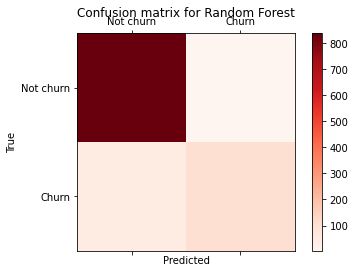

Logistic Regression
Accuracy is: 0.861
precision is: 0.706
recall is: 0.225


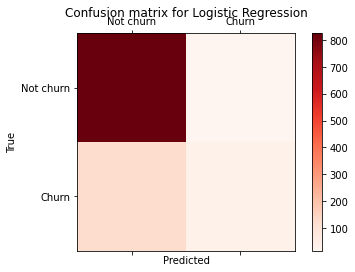

KNN
Accuracy is: 0.845
precision is: 0.593
recall is: 0.100


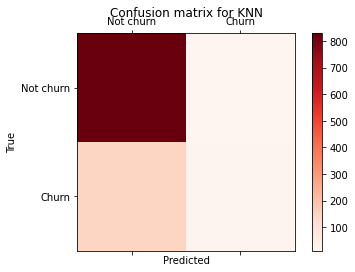

SVM
Accuracy is: 0.883
precision is: 0.717
recall is: 0.444


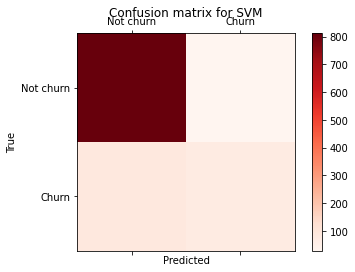

In [ ]:
%matplotlib inline

confusion_matrices = [
                      ('Random Forest', confusion_matrix(y_test, best_RF_model.predict(X_test))),
                      ('Logistic Regression', confusion_matrix(y_test, best_LR_model.predict(X_test))),
                      ('KNN', confusion_matrix(y_test, best_KNN_model.predict(X_test))),
                      ('SVM', confusion_matrix(y_test, best_SVM_model.predict(X_test)))
]

draw_cm(confusion_matrices)

Step 4: Model Evaluation


1.   ROC
2.   AUC



In [ ]:
# ROC/AUC for Random Forest
from sklearn.metrics import roc_curve
from sklearn import metrics

y_pred_rf = best_RF_model.predict_proba(X_test)[:,1]
fpr_1, tpr_1, _ = roc_curve(y_test, y_pred_rf)
auc_1 = metrics.auc(fpr_1, tpr_1)


In [ ]:
y_pred_KNN = best_KNN_model.predict_proba(X_test)[:,1]
fpr_2, tpr_2, _ = roc_curve(y_test, y_pred_KNN)
auc_2 = metrics.auc(fpr_2, tpr_2)


In [ ]:
y_pred_LR = best_LR_model.predict_proba(X_test)[:,1]
fpr_3, tpr_3, _ = roc_curve(y_test, y_pred_LR)
auc_3 = metrics.auc(fpr_3, tpr_3)


In [ ]:
# ROC of SVM 

y_score = best_SVM_model.fit(X_train, y_train).decision_function(X_test)
fpr_4, tpr_4, _ = roc_curve(y_test, y_score)
auc_4 = metrics.auc(fpr_4, tpr_4)


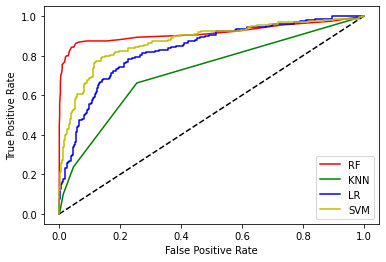



The AUC score of Random Forest model is 0.917
The AUC score of KNN model is 0.719
The AUC score of Logistic Regression model is 0.834
The AUC score of SVM model is 0.874


In [ ]:
plt.figure(1)
plt.plot([0,1], [0,1], 'k--' )
plt.plot(fpr_1, tpr_1, 'r', label = 'RF')
plt.plot(fpr_2,tpr_2,'g', label = 'KNN')
plt.plot(fpr_3, tpr_3, 'b', label='LR')
plt.plot(fpr_4,tpr_4, 'y', label = 'SVM')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')
plt.show()

print ('\n')
print ('The AUC score of Random Forest model is %.3f'% auc_1)
print ('The AUC score of KNN model is %.3f'% auc_2)
print ('The AUC score of Logistic Regression model is %.3f'% auc_3)
print ('The AUC score of SVM model is %.3f'% auc_4) 

In [ ]:
# Feature selection discussion
# Check feature importance using Random Forest

rf = RandomForestClassifier()
rf.fit(churn_data, churn_label)

importance = rf.feature_importances_
print ("Feature importance rank: ")
for k,v in sorted(zip(map(lambda x: round(x,4), importance), churn_data.columns), reverse=True):
  print (v + ":" + str(k))

Feature importance rank: 
total_day_charge:0.1348
total_day_minutes:0.1308
number_customer_service_calls:0.108
intl_plan:0.0757
total_eve_minutes:0.0559
total_eve_charge:0.0556
total_intl_minutes:0.0438
total_intl_calls:0.0429
total_night_minutes:0.0385
total_intl_charge:0.038
total_night_charge:0.0373
account_length:0.0305
total_day_calls:0.0304
total_night_calls:0.0297
total_eve_calls:0.0278
number_vmail_messages:0.0231
voice_mail_plan:0.0173
TX:0.0033
NJ:0.0031
WA:0.0025
WV:0.0024
CA:0.0024
MD:0.0023
NY:0.0022
MT:0.0022
MN:0.0022
ME:0.0022
MS:0.002
WY:0.0018
OH:0.0018
ID:0.0018
AZ:0.0018
NV:0.0017
MI:0.0017
KS:0.0017
DC:0.0017
UT:0.0016
TN:0.0016
SC:0.0016
OR:0.0016
IN:0.0016
ND:0.0015
IL:0.0015
SD:0.0014
NC:0.0014
MA:0.0014
LA:0.0014
CT:0.0014
CO:0.0014
WI:0.0013
NH:0.0013
MO:0.0012
KY:0.0012
DE:0.0012
AR:0.0012
NM:0.0011
GA:0.0011
FL:0.0011
VT:0.001
VA:0.001
PA:0.001
OK:0.001
NE:0.001
IA:0.001
RI:0.0009
AL:0.0008
HI:0.0006
AK:0.0006
